# Chapter 7: Image Enhancement

## Point-wise intensity transformations – pixel transformation

In [26]:
%matplotlib inline
import numpy as np
from skimage import data, img_as_float, img_as_ubyte, exposure, io, color
from skimage.io import imread
from skimage.exposure import cumulative_distribution
from skimage.restoration import denoise_bilateral, denoise_nl_means, estimate_sigma
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.util import random_noise
from skimage.color import rgb2gray
from PIL import Image, ImageEnhance, ImageFilter
from scipy import ndimage, misc
import matplotlib
import matplotlib.pylab as plt
import warnings
warnings.filterwarnings('ignore')

### Log transform

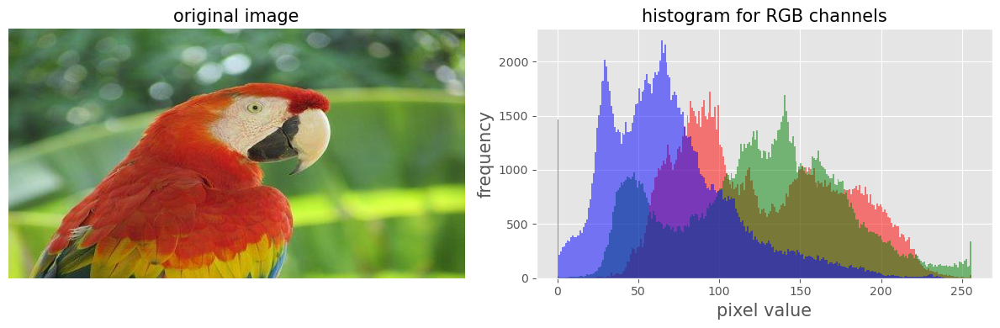

In [19]:
def plot_image(image, title=''):
    plt.title(title, size=15), plt.imshow(image, aspect='auto')
    plt.axis('off') # comment this line if you want axis ticks
    
def plot_hist(r, g, b, title=''):
    r, g, b = img_as_ubyte(r), img_as_ubyte(g), img_as_ubyte(b)
    plt.hist(np.array(r).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
    plt.hist(np.array(g).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
    plt.hist(np.array(b).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
    plt.xlabel('pixel value', size=15), plt.ylabel('frequency', size=15)
    plt.title(title, size=15)
    
im = Image.open("images/parrot.jpg")
im_r, im_g, im_b = im.split()
plt.style.use('ggplot')
plt.figure(figsize=(12,4))
plt.subplot(121), plot_image(im, 'original image')
plt.subplot(122), plot_hist(im_r, im_g, im_b,'histogram for RGB channels')
plt.tight_layout()
plt.show()

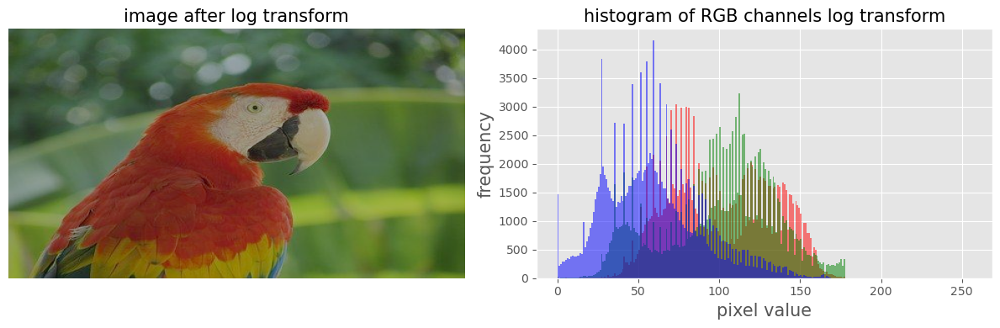

In [20]:
im = im.point(lambda i: 255*np.log(1+i/255))
im_r, im_g, im_b = im.split()
plt.style.use('ggplot')
plt.figure(figsize=(12,4))
plt.subplot(121), plot_image(im, 'image after log transform')
plt.subplot(122), plot_hist(im_r, im_g, im_b, 'histogram of RGB channels log transform')
plt.tight_layout()
plt.show()

### Power-law transform

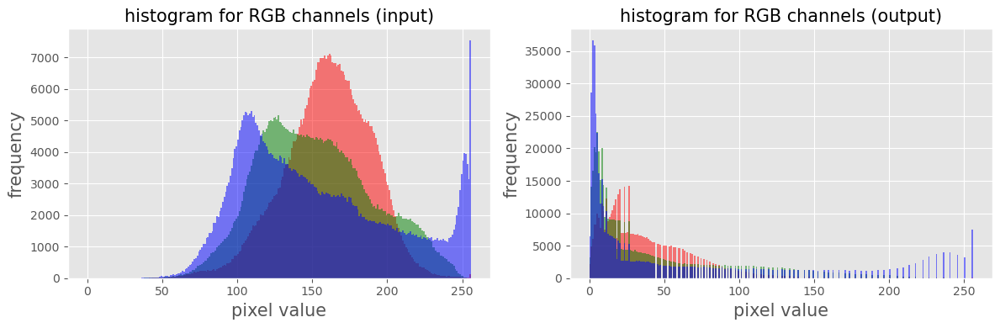

In [21]:
im = img_as_float(imread('images/earthfromsky.jpg'))
γ = 5
im1 = im**γ
plt.style.use('ggplot')
plt.figure(figsize=(12,4))
plt.subplot(121), plot_hist(im[...,0], im[...,1], im[...,2], 'histogram for RGB channels (input)')
plt.subplot(122), plot_hist(im1[...,0], im1[...,1], im1[...,2], 'histogram for RGB channels (output)')
plt.tight_layout()
plt.show()

![](images/earthfromsky_log.jpg)

## Brightness adjustment

In [3]:
## TODO

## Contrast Stretching

### Using `PIL` as a point operation

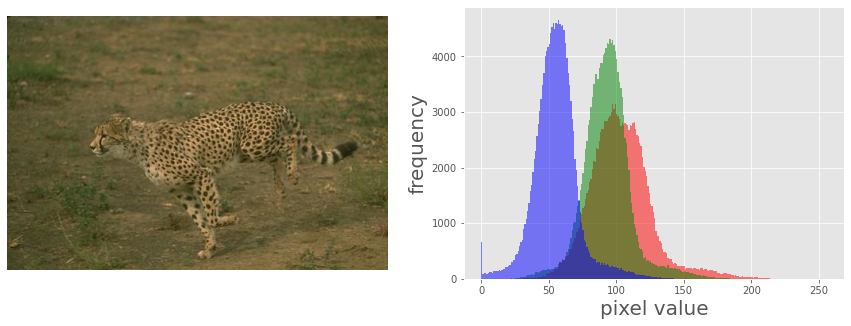

In [8]:
im = Image.open('images/cheetah.png')
im_r, im_g, im_b, _ = im.split()
plt.style.use('ggplot')
plt.figure(figsize=(15,5))
plt.subplot(121)
plot_image(im)
plt.subplot(122)
plot_hist(im_r, im_g, im_b)
plt.show()

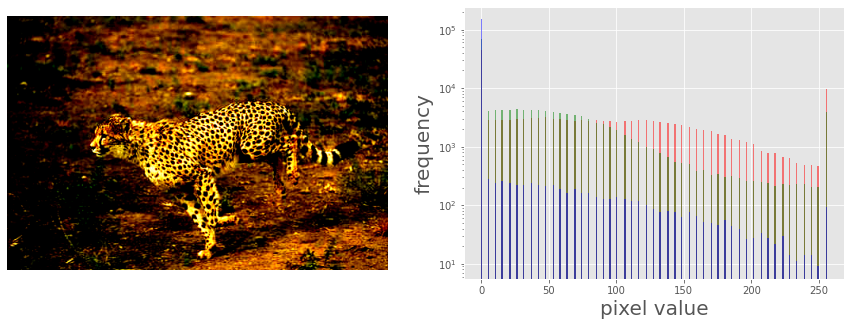

In [10]:
def contrast(c):
    return 0 if c < 70 else (255 if c > 150 else (255*c - 22950) / 48) # piece-wise linear function

im1 = im.point(contrast)
im_r, im_g, im_b, _ = im1.split()
plt.style.use('ggplot')
plt.figure(figsize=(15,5))
plt.subplot(121)
plot_image(im1)
plt.subplot(122)
plot_hist(im_r, im_g, im_b)
plt.yscale('log')
plt.show()

### Using the `PIL.ImageEnhance` module

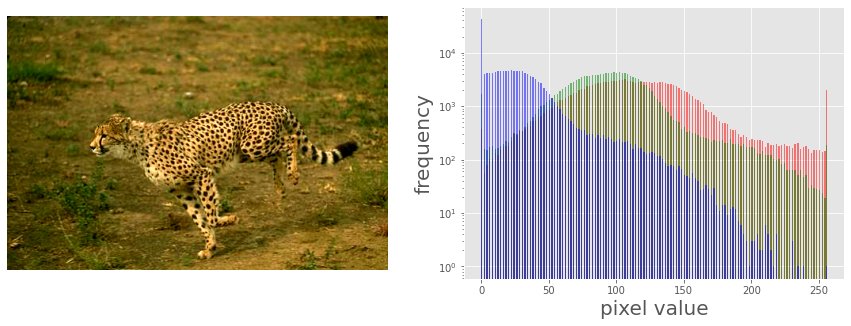

In [12]:
contrast = ImageEnhance.Contrast(im)
im1 = np.reshape(np.array(contrast.enhance(2).getdata()).astype(np.uint8), (im.height, im.width, 4)) 
plt.style.use('ggplot')
plt.figure(figsize=(15,5))
plt.subplot(121), plot_image(im1)
plt.subplot(122), plot_hist(im1[...,0], im1[...,1], im1[...,2]), plt.yscale('log')
plt.show()

## Thresholding

### Thresholding With a fixed threshold

In [ ]:
im = Image.open('images/swans.jpg').convert('L')
plt.hist(np.array(im).ravel(), bins=256, range=(0, 256), color='g')
plt.xlabel('Pixel values'), plt.ylabel('Frequency'),
plt.title('Histogram of pixel values')
plt.show()
plt.figure(figsize=(8,12))
plt.gray()
plt.subplot(221), plot_image(im, 'original image'), plt.axis('off')
th = [0, 50, 100, 150, 200]
for i in range(2, 5):
    im1 = im.point(lambda x: x > th[i])
    plt.subplot(2,2,i), plot_image(im1, 'binary image with threshold=' + str(th[i]))
plt.tight_layout()
plt.show()

### Half-toning

In [ ]:
im = Image.open('images/swans.jpg').convert('L')
im = Image.fromarray(np.clip(im + np.random.randint(-128, 128, (im.height, im.width)), 0, 255).astype(np.uint8))
plt.figure(figsize=(8,12))
plt.subplot(221), plot_image(im, 'original image (with noise)')
th = [0, 50, 100, 150, 200]
for i in range(2, 5):
    im1 = im.point(lambda x: x > th[i])
    plt.subplot(2,2,i), plot_image(im1, 'binary image with threshold=' +   str(th[i]))
plt.tight_layout()
plt.show()

## Floyd-Steinberg dithering with error diffusion

In [ ]:
## ToDo

![](images/fsdo.png)

## Histogram processing – Histogram Modification, Equalization and Matching

## Histogram Modification

0 84


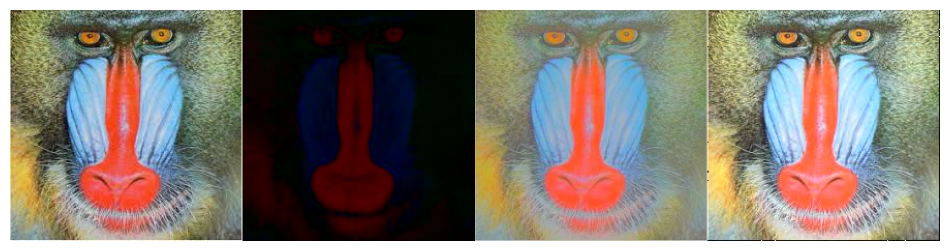

In [63]:
import cv2
import numpy as np

def histogram_stretching(image):
    # Compute the minimum and maximum intensity values
    min_val, max_val = np.min(image), np.max(image)
    # Stretch the histogram
    stretched = 255 * (image - min_val) / (max_val - min_val)
    return stretched.astype(np.uint8)

def histogram_shrinking(image, target_range=(100, 200)):
    min_val, max_val = np.min(image), np.max(image)
    # Shrink the histogram
    shrunk = (image - min_val) / (max_val - min_val) * (target_range[1] - target_range[0]) + target_range[0]
    return shrunk.astype(np.uint8)

def histogram_sliding(image, shift_value=30):
    # Slide the histogram
    slid = np.clip(image + shift_value, 0, 255)
    return slid.astype(np.uint8)

# Example usage
#image = plt.imread('images/mandrill.jpg')
image = cv2.imread('images/mandrill.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

stretched_image = image.copy()
shrunk_image = image.copy()
slid_image = image.copy()

#for i in range(3):
i = 0
stretched_image[...,i] = histogram_stretching(stretched_image[...,i])
shrunk_image[...,i] = histogram_shrinking(shrunk_image[...,i])
slid_image[...,i] = histogram_sliding(slid_image[...,i])

image = cv2.cvtColor(image, cv2.COLOR_LAB2RGB)
stretched_image = cv2.cvtColor(stretched_image, cv2.COLOR_LAB2RGB)
shrunk_image = cv2.cvtColor(shrunk_image, cv2.COLOR_LAB2RGB)
slid_image = cv2.cvtColor(slid_image, cv2.COLOR_LAB2RGB)
print(stretched_image.min(), stretched_image.max())

plt.figure(figsize=(12,4))
plt.imshow(np.hstack((image, stretched_image, shrunk_image, slid_image))), plt.axis('off')
plt.show()

### Contrast Stretching and Histogram Equalization with `scikit-image`

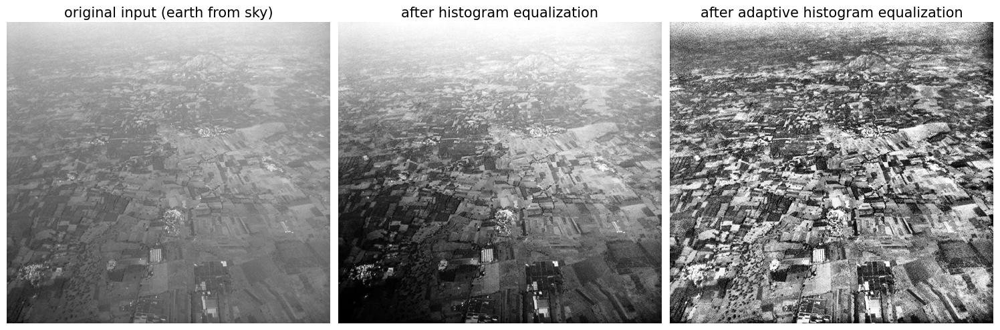

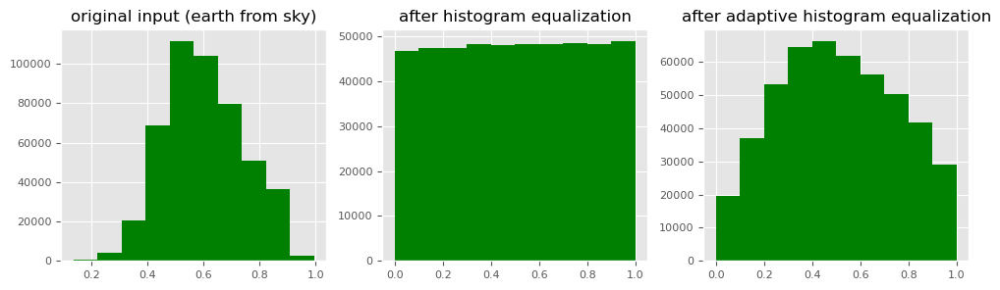

In [55]:
img = rgb2gray(imread('images/earthfromsky.jpg'))
# histogram equalization
img_eq = exposure.equalize_hist(img)
# adaptive histogram equalization
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)
images = [img, img_eq, img_adapteq]
titles = ['original input (earth from sky)', 'after histogram equalization', 'after adaptive histogram equalization']
plt.figure(figsize=(15,5))
for i in range(3):
    plt.subplot(1,3,i+1), plot_image(images[i], titles[i])
plt.tight_layout()
plt.show()
plt.figure(figsize=(10,3))
plt.gray()
for i in range(3):
    plt.subplot(1,3,i+1), plt.hist(images[i].ravel(), color='g'), plt.title(titles[i], size=12)
plt.tight_layout()
plt.show()

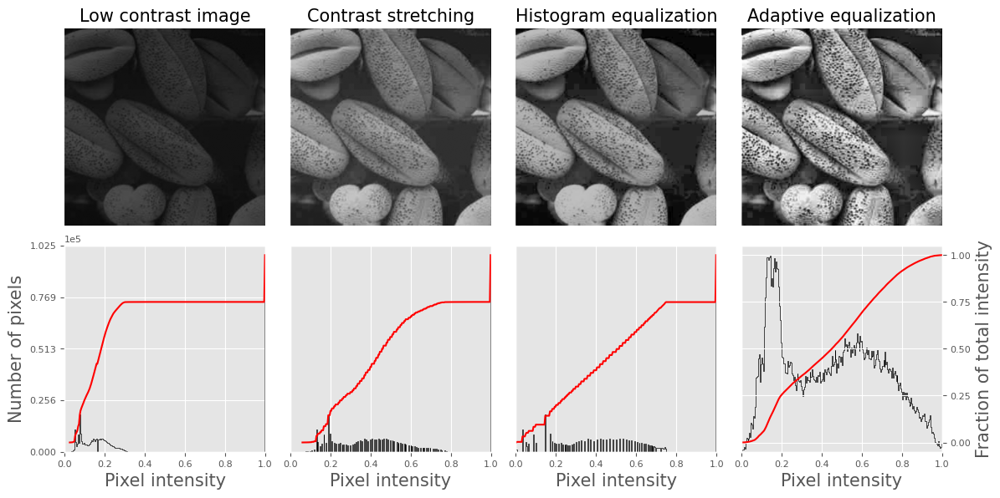

In [48]:
def plot_image_and_hist(image, axes, bins=256):
    image = img_as_float(image)
    axes_image, axes_hist = axes
    axes_cdf = axes_hist.twinx()
    axes_image.imshow(image, cmap=plt.cm.gray)
    axes_image.set_axis_off()
    axes_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    axes_hist.set_xlim(0, 1)
    axes_hist.set_xlabel('Pixel intensity', size=15)
    axes_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    axes_hist.set_yticks([])
    image_cdf, bins = exposure.cumulative_distribution(image, bins)
    axes_cdf.plot(bins, image_cdf, 'r')
    axes_cdf.set_yticks([])
    return axes_image, axes_hist, axes_cdf

im = io.imread('images/beans_g.png')
# contrast stretching
im_rescale = exposure.rescale_intensity(im, in_range=(0, 100), out_range=(0, 255))
im_rescale = im_rescale.astype(np.uint8)
im_eq = exposure.equalize_hist(im) # histogram equalization
im_adapteq = exposure.equalize_adapthist(im, clip_limit=0.03) # adaptive histogram equalization

matplotlib.rcParams['font.size'] = 8

fig = plt.figure(figsize=(12, 6))
axes = np.zeros((2, 4), dtype = 'object')
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im, axes[:, 0])
axes_image.set_title('Low contrast image', size=15)
y_min, y_max = axes_hist.get_ylim()
axes_hist.set_ylabel('Number of pixels', size=15)
axes_hist.set_yticks(np.linspace(0, y_max, 5))
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_rescale, axes[:,1])
axes_image.set_title('Contrast stretching', size=15)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_eq, axes[:, 2])
axes_image.set_title('Histogram equalization', size=15)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_adapteq, axes[:,3])
axes_image.set_title('Adaptive equalization', size=15)
axes_cdf.set_ylabel('Fraction of total intensity', size=15)
axes_cdf.set_yticks(np.linspace(0, 1, 5))
fig.tight_layout()
plt.show()

The above figure shows the output of the previous code snippet. As can be seen, adaptive
histogram equalization provides better results than histogram equalization in terms of making the details of the output image clearer. Using the low-contrast colored cheetah input image instead, the previous code produces
the following output:

![](images/cheetah_hist_eq.png)

## Image Contrast Enhancement Using Fuzzy Logic with Mamdani System

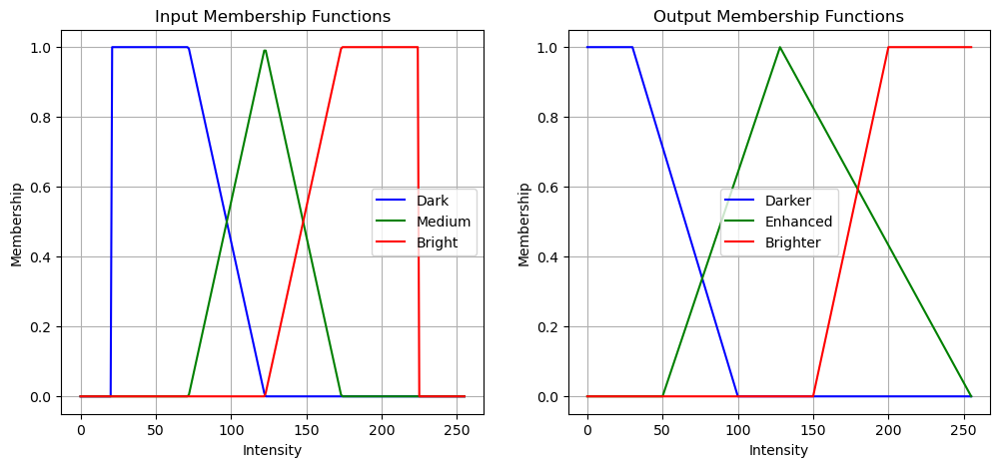

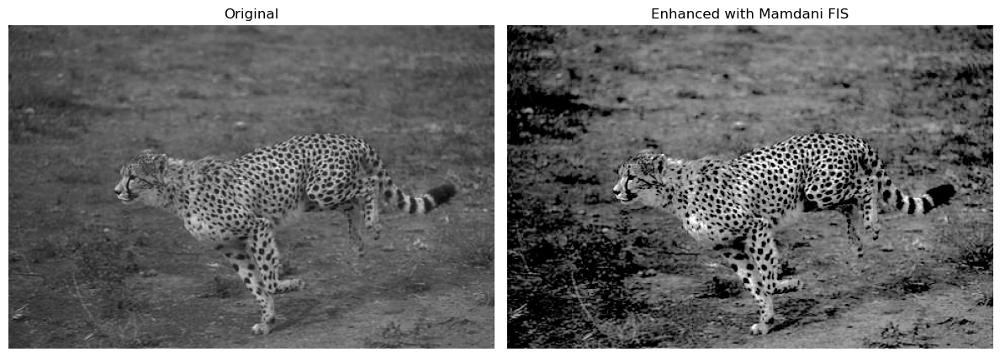

In [5]:
import cv2
import numpy as np
import skfuzzy as fuzz
import matplotlib.pyplot as plt

def fuzzy_enhance_pixel(value):
    # Fuzzification
    dark_level = fuzz.interp_membership(x, input_dark, value)
    medium_level = fuzz.interp_membership(x, input_medium, value)
    bright_level = fuzz.interp_membership(x, input_bright, value)

    # Rule-based inference using Mamdani min-max composition
    rule_darker = np.fmin(dark_level, output_darker)
    rule_enhanced = np.fmin(medium_level, output_enhanced)
    rule_brighter = np.fmin(bright_level, output_brighter)

    # Aggregate all rules (max)
    aggregated = np.fmax(rule_darker, np.fmax(rule_enhanced, rule_brighter))

    # Defuzzification (centroid)
    return fuzz.defuzz(x, aggregated, 'centroid')

def fuzzy_image_enhancement(img_gray):
    img_out = np.zeros_like(img_gray, dtype=np.uint8)
    h, w = img_gray.shape
    for i in range(h):
        for j in range(w):
            pixel = img_gray[i, j]
            enhanced_val = fuzzy_enhance_pixel(pixel)
            img_out[i, j] = np.clip(enhanced_val, 0, 255)
    return img_out

# Load grayscale image
img_path = "images/cheetah.png"
img_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
img_min, img_max = int(np.min(img_gray)), int(np.max(img_gray))

# Create fuzzy membership functions for input and output
x = np.arange(0, 256, 1)

# Calculate key points for fuzzy input MFs
range_width = img_max - img_min
low = img_min + 0.25 * range_width
mid = img_min + 0.5 * range_width
high = img_min + 0.75 * range_width

# Input fuzzy sets dynamically based on image intensity range
input_dark = fuzz.trapmf(x, [img_min, img_min, low, mid])
input_medium = fuzz.trimf(x, [low, mid, high])
input_bright = fuzz.trapmf(x, [mid, high, img_max, img_max])

# Output fuzzy sets (contrast enhancement)
output_darker = fuzz.trapmf(x, [0, 0, 30, 100])
output_enhanced = fuzz.trimf(x, [50, 128, 255])
output_brighter = fuzz.trapmf(x, [150, 200, 255, 255])

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(x, input_dark, label='Dark', color='blue')
plt.plot(x, input_medium, label='Medium', color='green')
plt.plot(x, input_bright, label='Bright', color='red')
plt.title('Input Membership Functions')
plt.xlabel('Intensity')
plt.ylabel('Membership')
plt.grid(True)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(x, output_darker, label='Darker', color='blue')
plt.plot(x, output_enhanced, label='Enhanced', color='green')
plt.plot(x, output_brighter, label='Brighter', color='red')
plt.title('Output Membership Functions')
plt.xlabel('Intensity')
plt.ylabel('Membership')
plt.grid(True)
plt.legend()

# Apply fuzzy enhancement
img_fuzzy = fuzzy_image_enhancement(img_gray)

# Display results
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap='gray')
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_fuzzy, cmap='gray')
plt.title("Enhanced with Mamdani FIS")
plt.axis("off")
plt.tight_layout()
plt.show()

## Histogram Matching

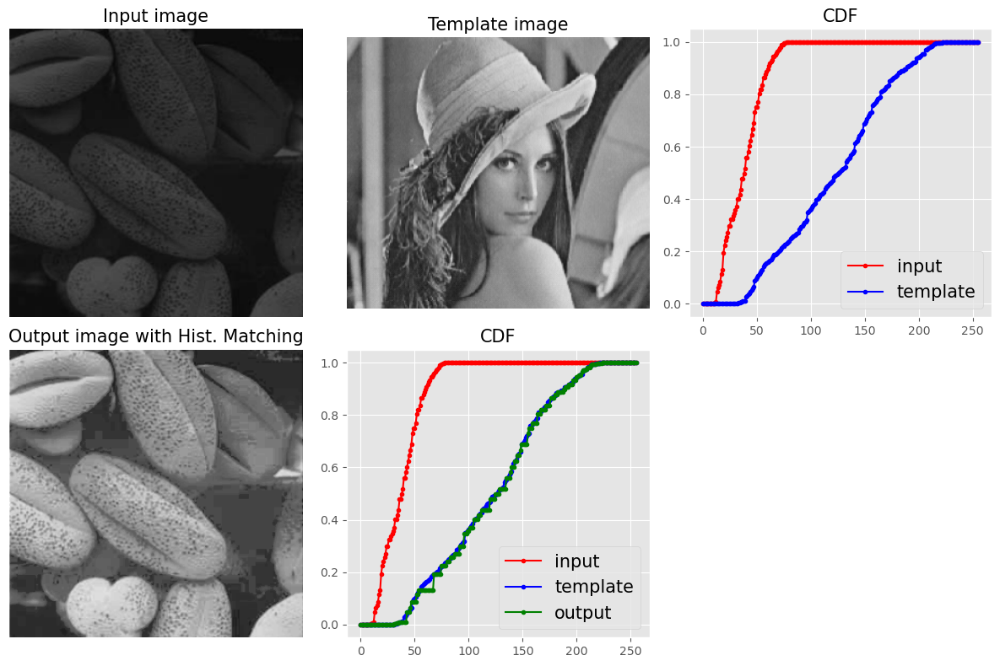

In [45]:
def cdf(im):
    '''
    computes the CDF of an image im as 2D numpy ndarray
    '''
    c, b = cumulative_distribution(im)
    # pad the beginning and ending pixels and their CDF values
    c = np.insert(c, 0, [0]*b[0])
    c = np.append(c, [1]*(255-b[-1]))
    return c

def hist_matching(c, c_t, im):
    '''
    c: CDF of input image computed with the function cdf()
    c_t: CDF of template image computed with the function cdf()
    im: input image as 2D numpy ndarray
    returns the modified pixel values for the input image
    '''
    pixels = np.arange(256)
    # find closest pixel-matches corresponding to the CDF of the input image, given the value of the CDF H of
    # the template image at the corresponding pixels, s.t. c_t = H(pixels) <=> pixels = H-1(c_t)
    new_pixels = np.interp(c, c_t, pixels)
    im_out = (np.reshape(new_pixels[im.ravel()], im.shape)).astype(np.uint8)
    return im_out

def plot_image_values(image, title=''):
    plt.title(title, size=15), plt.imshow(image, vmin=0, vmax=255)
    plt.axis('off') # comment this line if you want axis ticks    

im = (rgb2gray(imread('images/beans_g.png')[...,:3])*255).astype(np.uint8)
im_t = (rgb2gray(imread('images/lena_g.png'))*255).astype(np.uint8)
plt.figure(figsize=(12,8))
plt.gray()
plt.subplot(231), plot_image_values(im, 'Input image')
plt.subplot(232), plot_image_values(im_t, 'Template image')
c = cdf(im)
c_t = cdf(im_t)
p = np.arange(256)
plt.subplot(233)
plt.plot(p, c, 'r.-', label='input')
plt.plot(p, c_t, 'b.-', label='template')
plt.legend(prop={'size': 15})
plt.title('CDF', size=15)
im_out = hist_matching(c, c_t, im)
plt.subplot(234), plot_image_values(im_out, 'Output image with Hist. Matching')
c1 = cdf(im_out)
plt.subplot(235)
plt.plot(np.arange(256), c, 'r.-', label='input')
plt.plot(np.arange(256), c_t, 'b.-', label='template')
plt.plot(np.arange(256), c1, 'g.-', label='output')
plt.legend(prop={'size': 15})
plt.title('CDF', size=15)
plt.tight_layout()
plt.show()

### Histogram matching for an RGB image

![](images/hist_match_col.png)  

## Linear noise smoothing

### Smoothing with PIL

### Smoothing with ImageFilter.BLUR

In [ ]:
i = 1
plt.figure(figsize=(8,10))
for prop_noise in np.linspace(0.05,0.3,3):
    im = Image.open('images/mandrill.jpg')
    # choose 5000 random locations inside image
    n = int(im.width * im.height * prop_noise)
    x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
    for (x,y) in zip(x,y):
        im.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # generate salt-and-pepper noise
    im.save('images/mandrill_spnoise_' + str(prop_noise) + '.jpg')
    plt.subplot(3,2,i), plot_image(im, 'Original Image with ' +
    str(int(100*prop_noise)) + '% added noise')
    i += 1
    im1 = im.filter(ImageFilter.BLUR)
    plt.subplot(3,2,i), plot_image(im1, 'Blurred Image')
    i += 1
plt.tight_layout()
plt.show()

### Smoothing by averaging with the box blur kernel

In [ ]:
im = Image.open('images/mandrill_spnoise_0.1.jpg')
plt.figure(figsize=(10,4))
plt.subplot(1,3,1), plt.imshow(im), plt.title('Original Image', size=15), plt.axis('off')
for n in [3,5]:
    box_blur_kernel = np.reshape(np.ones(n*n),(n,n)) / (n*n)
    im1 = im.filter(ImageFilter.Kernel((n,n), box_blur_kernel.flatten()))
    plt.subplot(1,3,(2 if n==3 else 3))
    plot_image(im1, 'Blurred with kernel size = ' + str(n) + 'x' + str(n))
plt.suptitle('PIL Mean Filter (Box Blur) with different Kernel size', size=18)
plt.tight_layout()
plt.show()

### Smoothing with the Gaussian blur filter

In [ ]:
im = Image.open('images/mandrill_spnoise_0.2.jpg')
plt.figure(figsize=(10,4))
i = 1
for radius in range(1, 4):
    im1 = im.filter(ImageFilter.GaussianBlur(radius))
    plt.subplot(1,3,i), plot_image(im1, 'radius = ' +
    str(round(radius,2)))
    i += 1
plt.suptitle('PIL Gaussian Blur with different Radius', size=20)
plt.tight_layout()
plt.show()

### Comparing smoothing with box and Gaussian kernels using `scipy.ndimage`

In [ ]:
im = plt.imread('images/mandrill_spnoise_0.1.jpg')
k = 7 # 7x7 kernel
im_box = ndimage.uniform_filter(im, size=(k,k,1))
s = 2 # sigma value
t = (((k - 1)/2)-0.5)/s # truncate parameter value for a kxk gaussian kernel with sigma s
im_gaussian = ndimage.gaussian_filter(im, sigma=(s,s,0), truncate=t)
fig = plt.figure(figsize=(20,10))
plt.subplot(131), plot_image(im, 'original image')
plt.subplot(132), plot_image(im_box, 'with the box filter')
plt.subplot(133), plot_image(im_gaussian, 'with the gaussian filter')
plt.tight_layout()
plt.show()

### Nonlinear noise smoothing

### Smoothing with PIL

### Using the median filter

In [ ]:
i = 1
plt.figure(figsize=(25,18))
for prop_noise in np.linspace(0.05,0.3,3):
    im = Image.open('images/mandrill.jpg')
    # choose 5000 random locations inside image
    n = int(im.width * im.height * prop_noise)
    x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
    for (x,y) in zip(x,y):
        im.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # geenrate salt-and-pepper noise
    im.save('images/mandrill_spnoise_' + str(prop_noise) + '.jpg')
    plt.subplot(3,4,i)
    plot_image(im, 'Original Image with ' + str(int(100*prop_noise)) + '%added noise')
    i += 1
    for sz in [3,7,11]:
        im1 = im.filter(ImageFilter.MedianFilter(size=sz))
        plt.subplot(3,4,i), plot_image(im1, 'Output (Median Filter size=' +  str(sz) + ')')
        i += 1
plt.tight_layout()
plt.show()

### Using mode filter

In [10]:
## ToDo

### Using max and min filter

In [ ]:
im = Image.open('images/mandrill_spnoise_0.1.jpg')
sz = 3
plt.figure(figsize=(20,8))
plt.subplot(131), plot_image(im, 'Original Image with 10% added noise')
im1 = im.filter(ImageFilter.MaxFilter(size=sz))
plt.subplot(132), plot_image(im1, 'Output (Max Filter size=' + str(sz)+ ')')
im1 = im1.filter(ImageFilter.MinFilter(size=sz))
plt.subplot(133), plot_image(im1, 'Output (Min Filter size=' + str(sz)+ ')')
plt.tight_layout()
plt.show()

## Smoothing (denoising) with scikit-image


### Using the bilateral filter

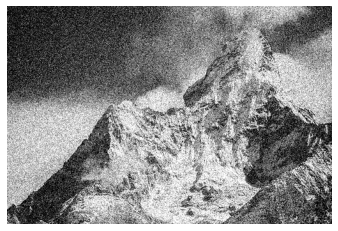

In [69]:
im = color.rgb2gray(img_as_float(io.imread('images/mountain.png')))
sigma = 0.155
noisy = random_noise(im, var=sigma**2)
plt.imshow(noisy), plt.axis('off')
plt.show()

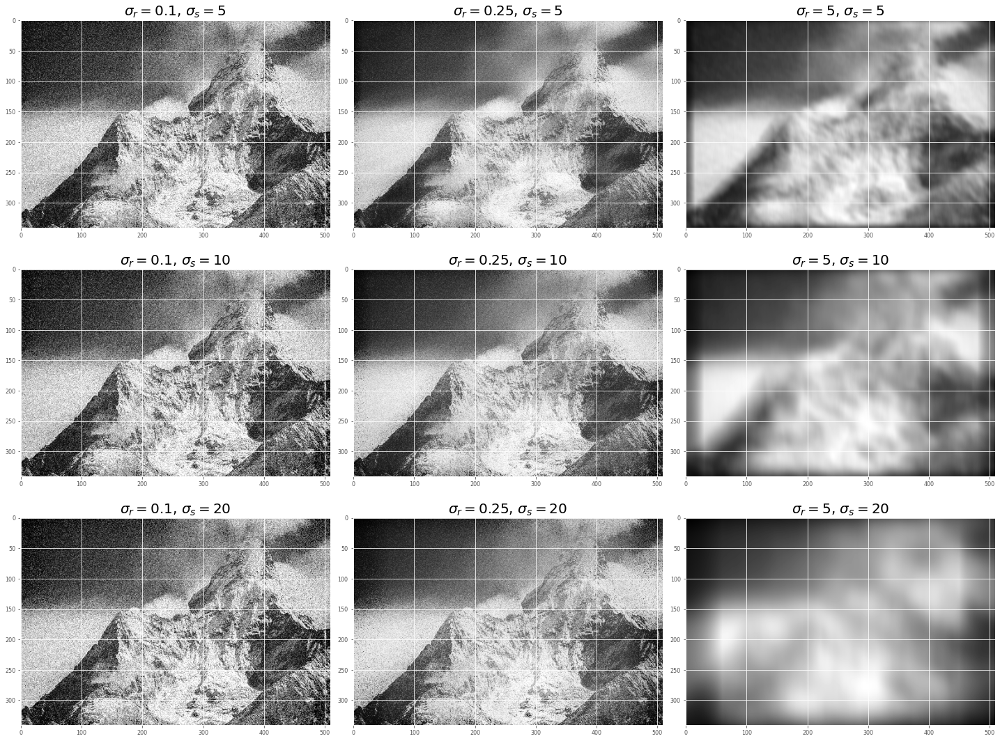

In [71]:
plt.figure(figsize=(20,15))
i = 1
for sigma_sp in [5, 10, 20]:
    for sigma_col in [0.1, 0.25, 5]:
        plt.subplot(3,3,i)
        plt.imshow(denoise_bilateral(noisy, sigma_color=sigma_col,
        sigma_spatial=sigma_sp, multichannel=False))
        plt.title(r'$\sigma_r=$' + str(sigma_col) + r', $\sigma_s=$' + str(sigma_sp), size=20)
        i += 1
plt.tight_layout()
plt.show()

### Using non-local means

estimated noise standard deviation = 0.21826957514919917
PSNR (noisy) = 13.04
PSNR (slow) = 25.98
PSNR (fast) = 26.17


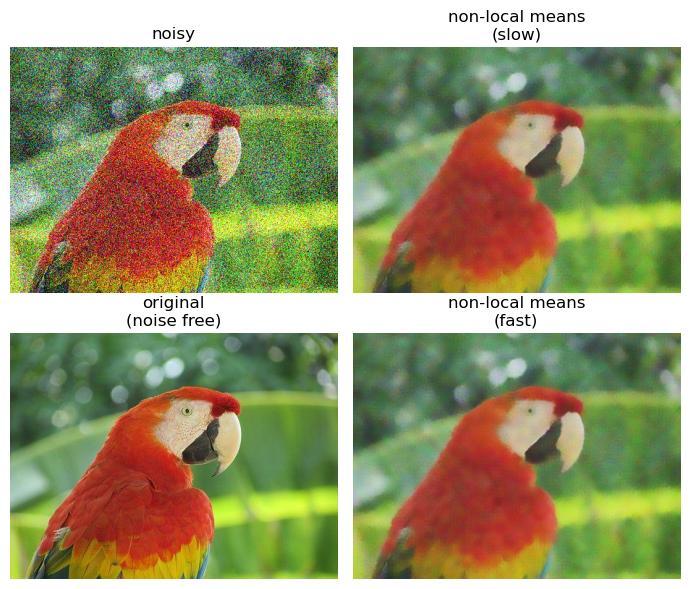

In [36]:
def plot_image_axes(image, axes, title):
    axes.imshow(image)
    axes.axis('off')
    axes.set_title(title, size=12)
    
parrot = img_as_float(imread('images/parrot.jpg'))
sigma = 0.25
noisy = parrot + sigma * np.random.standard_normal(parrot.shape)
noisy = np.clip(noisy, 0, 1)
# estimate the noise standard deviation from the noisy image
sigma_est = np.mean(estimate_sigma(noisy, channel_axis=-1))
print("estimated noise standard deviation = {}".format(sigma_est))
# estimated noise standard deviation = 0.22048519002358943
patch_kw = dict(patch_size=5, # 5x5 patches
                patch_distance=6, # 13x13 search area
                channel_axis=-1)
# slow algorithm
denoise = denoise_nl_means(noisy, h=1.15 * sigma_est, fast_mode=False, **patch_kw)
# fast algorithm
denoise_fast = denoise_nl_means(noisy, h=0.8 * sigma_est, fast_mode=True, **patch_kw)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(7, 6), sharex=True, sharey=True)
plot_image_axes(noisy, axes[0, 0], 'noisy')
plot_image_axes(denoise, axes[0, 1], 'non-local means\n(slow)')
plot_image_axes(parrot, axes[1, 0], 'original\n(noise free)')
plot_image_axes(denoise_fast, axes[1, 1], 'non-local means\n(fast)')
fig.tight_layout()
# PSNR metric values
psnr_noisy = compare_psnr(parrot, noisy)
psnr = compare_psnr(parrot, denoise.astype(np.float64))
psnr_fast = compare_psnr(parrot, denoise_fast.astype(np.float64))
print("PSNR (noisy) = {:0.2f}".format(psnr_noisy))
print("PSNR (slow) = {:0.2f}".format(psnr))
print("PSNR (fast) = {:0.2f}".format(psnr_fast))
# PSNR (noisy) = 13.04 # PSNR (slow) = 26.25 # PSNR (fast) = 25.84
plt.show()

### Smoothing with `scipy.ndimage`

In [ ]:
lena = misc.imread('images/lena.jpg')
# add salt-and-pepper noise to the input image
noise = np.random.random(lena.shape)
lena[noise > 0.9] = 255
lena[noise < 0.1] = 0
plot_image(lena, 'noisy image')
plt.show()
fig = plt.figure(figsize=(20,15))
i = 1
for p in range(25, 100, 25):
    for k in range(5, 25, 5):
        plt.subplot(3,4,i)
        filtered = ndimage.percentile_filter(lena, percentile=p, size=(k,k,1))
        plot_image(filtered, str(p) + ' percentile, ' + str(k) + 'x' + str(k) + ' kernel')
        i += 1
plt.show()

## BM3D Denoising

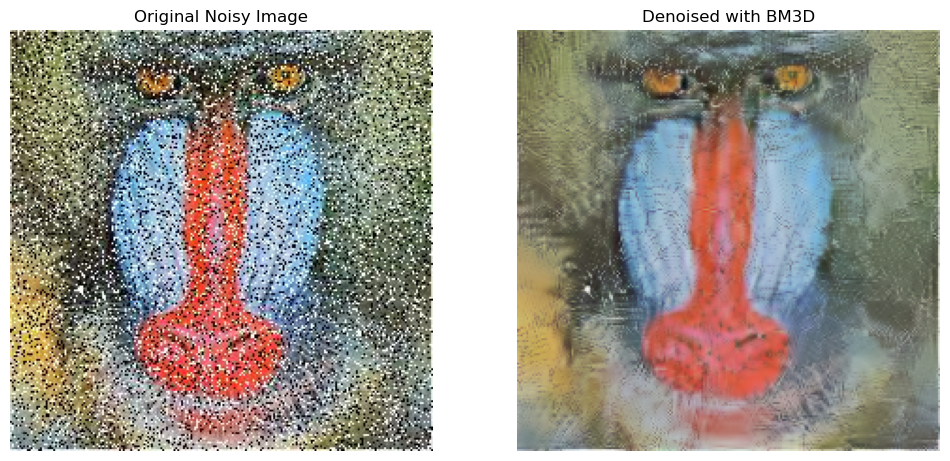

In [12]:
#!pip install bm3d

import bm3d
import cv2
from skimage import io, img_as_float
import matplotlib.pyplot as plt

# Load a noisy image
image_path = 'images/mandrill_spnoise_0.3.jpg'
noisy_image = img_as_float(io.imread(image_path)) #, as_gray=True))

# Apply BM3D denoising
denoised = bm3d.bm3d(noisy_image, sigma_psd=0.2, stage_arg=bm3d.BM3DStages.ALL_STAGES)

# Display the results
plt.figure(figsize=(12, 6))
plt.subplot(121), plt.imshow(noisy_image, cmap='gray'), plt.title('Original Noisy Image'), plt.axis('off')
plt.subplot(122), plt.imshow(bm3d_result, cmap='gray'), plt.title('Denoised with BM3D'), plt.axis('off')
plt.show()

Sigma_psd: 0.05, PSNR: 21.95, SSIM: 0.4385
Sigma_psd: 0.075, PSNR: 28.26, SSIM: 0.7637
Sigma_psd: 0.1, PSNR: 29.83, SSIM: 0.8240
Sigma_psd: 0.125, PSNR: 29.29, SSIM: 0.7925
Sigma_psd: 0.15, PSNR: 28.98, SSIM: 0.7777


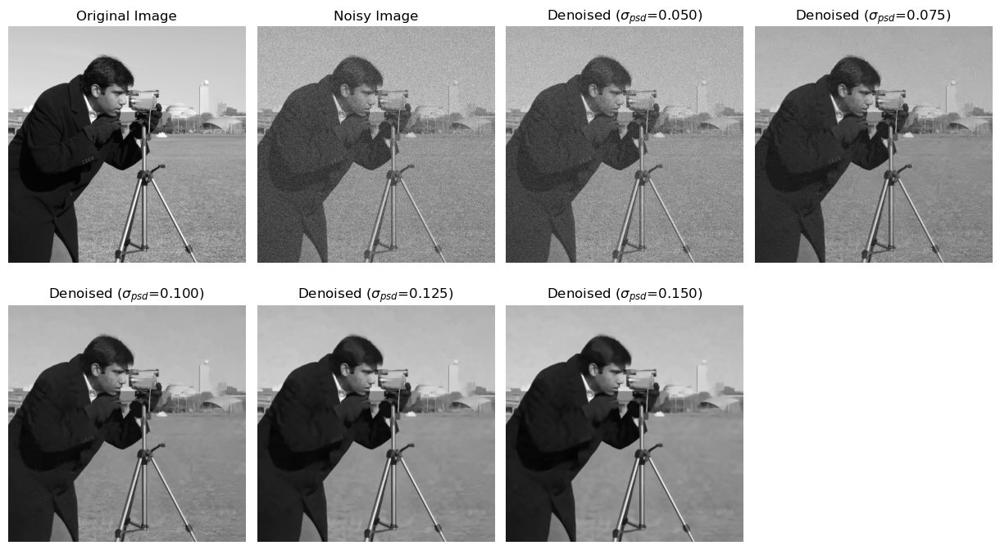

In [20]:
import bm3d
import numpy as np
from skimage import metrics, data, img_as_float
import matplotlib.pyplot as plt

# Load or generate a noisy image
original_image = img_as_float(data.camera())  # Example clean image
noise_std = 0.1  # Standard deviation of the noise
noisy_image = original_image + noise_std * np.random.randn(*original_image.shape)

# Range of sigma_psd values to test
sigma_values = np.linspace(0.05, 0.15, 5)

# Function to evaluate denoising performance
def evaluate_denoising_performance(original, denoised):
    psnr_value = metrics.peak_signal_noise_ratio(original, denoised)
    ssim_value = metrics.structural_similarity(original, denoised, data_range=denoised.max()-denoised.min()) #, channel_axis=2)
    return psnr_value, ssim_value

# Optionally, visualize the best-performing denoised image
plt.figure(figsize=(12, 7))
plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
plt.subplot(241), plt.imshow(original_image, cmap='gray'), plt.title('Original Image'), plt.axis('off')
plt.subplot(242), plt.imshow(noisy_image, cmap='gray'), plt.title('Noisy Image'), plt.axis('off')
# Test different sigma_psd values
i = 3
for sigma_psd in sigma_values:
    denoised_image = bm3d.bm3d(noisy_image, sigma_psd=sigma_psd, stage_arg=bm3d.BM3DStages.ALL_STAGES)
    psnr, ssim = evaluate_denoising_performance(original_image, denoised_image)
    print(f"Sigma_psd: {sigma_psd}, PSNR: {psnr:.2f}, SSIM: {ssim:.4f}")
    # Assuming the last sigma_psd value gives the best result for demonstration
    plt.subplot(2,4,i), plt.imshow(denoised_image, cmap='gray'), plt.title(r'Denoised ($\sigma_{psd}$=' + f'{sigma_psd:.03f})'), plt.axis('off')
    i += 1
plt.show()

In [13]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def evaluate_denoising_performance(original, denoised):
    psnr_value = psnr(original, denoised, data_range=denoised.max() - denoised.min())
    ssim_value = ssim(original, denoised, data_range=denoised.max() - denoised.min(), channel_axis=2)    
    return psnr_value, ssim_value

original = img_as_float(io.imread('images/mandrill.jpg'))
# Assuming `original_images` and `denoised_images` are lists of images
psnr_value, ssim_value = evaluate_denoising_performance(original, denoised)
print(f"PSNR: {psnr_value}, SSIM: {ssim_value}")

PSNR: 19.572008112856363, SSIM: 0.42267909385403984


## Low-Light Image Enhancement with Zero-DCE

In [ ]:
import torch, torchvision
import torch.nn as nn
from pathlib import Path
from PIL import Image
import numpy as np
import matplotlib.pylab as plt

class DCENet(nn.Module):
    '''https://li-chongyi.github.io/Proj_Zero-DCE.html'''

    def __init__(self, n=8, return_results=[4, 6, 8]):
        '''
        Args
        --------
          n: number of iterations of LE(x) = LE(x) + alpha * LE(x) * (1-LE(x)).
          return_results: [4, 8] => return the 4-th and 8-th iteration results.
        '''
        super().__init__()
        self.n = n
        self.ret = return_results

        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1, bias=True)
        self.conv2 = nn.Conv2d(32, 32, kernel_size=3, padding=1, bias=True)
        self.conv3 = nn.Conv2d(32, 32, kernel_size=3, padding=1, bias=True)
        self.conv4 = nn.Conv2d(32, 32, kernel_size=3, padding=1, bias=True)
        self.conv5 = nn.Conv2d(64, 32, kernel_size=3, padding=1, bias=True)
        self.conv6 = nn.Conv2d(64, 32, kernel_size=3, padding=1, bias=True)
        self.conv7 = nn.Conv2d(64, 3 * n, kernel_size=3, padding=1, bias=True)

        self.relu = nn.ReLU(inplace=True)
        self.tanh = nn.Tanh()

    def forward(self, x):
        out1 = self.relu(self.conv1(x))

        out2 = self.relu(self.conv2(out1))
        out3 = self.relu(self.conv3(out2))
        out4 = self.relu(self.conv4(out3))

        out5 = self.relu(self.conv5(torch.cat((out4, out3), 1)))
        out6 = self.relu(self.conv6(torch.cat((out5, out2), 1)))

        alpha_stacked = self.tanh(self.conv7(torch.cat((out6, out1), 1)))

        alphas = torch.split(alpha_stacked, 3, 1)
        results = [x]
        for i in range(self.n):
            # x = x + alphas[i] * (x - x**2)  # as described in the paper
            # sign doesn't really matter becaus of symmetry.
            x = x + alphas[i] * (torch.pow(x, 2) - x)
            if i + 1 in self.ret:
                results.append(x)

        return results, alpha_stacked

#import os
#os.environ['CUDA_LAUNCH_BLOCKING'] = "1" 
print(torch.cuda.is_available())
# True
device = torch.device('cuda:0')
model = DCENet(return_results=[4, 8])
model.load_state_dict(torch.load('models/8LE-color-loss2_best_model.pth',map_location='cuda:0',weights_only=False)['model'])
model.to(device)
inPath = Path('images/low_light_inp')
outPath = Path('images/enhanced_out')
outPath.mkdir(parents=True, exist_ok=True)
num_images = 0
for file in inPath.glob('*'):
      img = Image.open(file)
      img = torch.from_numpy(np.array(img))
      img = img.float().div(255)
      img = img.permute((2, 0, 1)).contiguous()
      img = img.unsqueeze(0)
      img = img.to(device)
      results, Astack = model(img)
      enhanced_image = results[1]
      torchvision.utils.save_image(enhanced_image, outPath.joinpath('enhanced_' + file.name))
      num_images += 1

![](images/dce_out.png)

## Denoising with Deep Learning (Noise2Void)

In [5]:
## ToDo

## Image Fusion with Wavelets

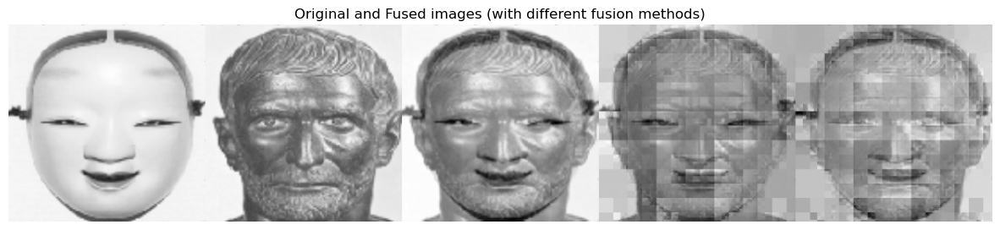

In [28]:
import pywt
import cv2
import numpy as np
import matplotlib.pylab as plt

# This function does the coefficient fusing according to the fusion method
def fuse_coefficients(coeff1, coeff2, method='mean'):
    if method == 'mean':
        return (coeff1 + coeff2) / 2
    elif method == 'min':
        return np.minimum(coeff1, coeff2)
    elif method == 'max':
        return np.maximum(coeff1, coeff2)
    else:
        raise ValueError("Unsupported fusion method")

def fuse_images(im1, im2, fusion_method, wavelet='db1'): # Daubechies wavelet
    
    # Resize im2 to match im1 if needed
    im2 = cv2.resize(im2, (im1.shape[1], im1.shape[0]))
    
    # Wavelet decomposition
    coeffs1 = pywt.wavedec2(im1, wavelet)
    coeffs2 = pywt.wavedec2(im2, wavelet)
    
    # Fuse wavelet coefficients
    fused_coeffs = []
    for i in range(len(coeffs1)):
        if i == 0:
            # Approximation coefficients
            fused_coeffs.append(fuse_coefficients(coeffs1[0], coeffs2[0], fusion_method))
        else:
            # Detail coefficients (horizontal, vertical, diagonal)
            c1 = fuse_coefficients(coeffs1[i][0], coeffs2[i][0], fusion_method)
            c2 = fuse_coefficients(coeffs1[i][1], coeffs2[i][1], fusion_method)
            c3 = fuse_coefficients(coeffs1[i][2], coeffs2[i][2], fusion_method)
            fused_coeffs.append((c1, c2, c3))
    
    # Reconstruct fused image
    fused_image = pywt.waverec2(fused_coeffs, wavelet)
    # Normalize to 8-bit range
    fused_image = 255 * (fused_image - fused_image.min()) / (fused_image.max() - fused_image.min())
    return fused_image.astype(np.uint8)

# Load grayscale input images
im1 = cv2.imread('images/mask.png', cv2.IMREAD_GRAYSCALE)
im2 = cv2.imread('images/dust.png', cv2.IMREAD_GRAYSCALE)

# Fith: Show image
plt.figure(figsize=(15,5))
plt.gray()
plt.imshow(np.hstack((im1, im2,  \
                      cv2.resize(fuse_images(im1, im2, 'mean'), (im1.shape[1], im1.shape[0])),
                      cv2.resize(fuse_images(im1, im2, 'max'), (im1.shape[1], im1.shape[0])),
                      cv2.resize(fuse_images(im1, im2, 'min'), (im1.shape[1], im1.shape[0])),
                     )))
plt.title('Original and Fused images (with different fusion methods)')
plt.axis('off');

##  Enhancements in Colors

###  Color balancing

In [ ]:
## ToDo

###  Color gamut and color correction matrix

In [ ]:
## ToDo

###       Color correction with white balance algorithms

In [ ]:
## ToDo

###    Color palette reduction with nearest colors

In [ ]:
## ToDo

## Haze Removal Using Dark Channel Prior

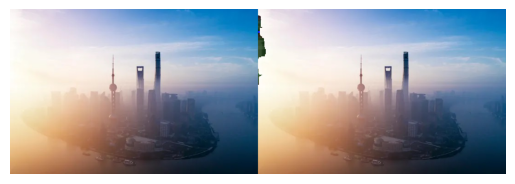

In [30]:
# https://github.com/ZQPei/Haze_Removal_python/blob/master/haze_removal.py
import cv2
import numpy as np

def dark_channel(im, sz):
    b, g, r = cv2.split(im)
    dc = cv2.min(cv2.min(r, g), b)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (sz, sz))
    dark = cv2.erode(dc, kernel)
    return dark

def estimate_atmospheric_light(im, dark):
    [h, w] = im.shape[:2]
    imsz = h * w
    numpx = int(max(np.floor(imsz / 1000), 1))
    darkvec = dark.reshape(imsz, 1)
    imvec = im.reshape(imsz, 3)

    indices = darkvec.argsort()
    indices = indices[imsz-numpx::]

    atmsum = np.zeros([1, 3])
    for ind in indices:
        atmsum = atmsum + imvec[ind]
    A = atmsum / numpx
    return A

def dehaze(im, A, omega=0.95, t0=0.1):
    im3 = np.empty(im.shape, im.dtype)

    for ind in range(0, 3):
        im3[:, :, ind] = im[:, :, ind] / A[0, ind]

    transmission = 1 - omega * dark_channel(im3, 15)

    t = cv2.max(transmission, t0)

    J = np.empty(im.shape, im.dtype)
    for ind in range(0, 3):
        J[:, :, ind] = (im[:, :, ind] - A[0, ind]) / t + A[0, ind]

    return J

# Example usage
img = plt.imread('images/hazy.jpg')
A = estimate_atmospheric_light(img, dark_channel(img, 15))
dehazed_img = dehaze(img, A)
#cv2.imwrite('images/output_dehazed.jpg', dehazed_img)
plt.imshow(np.hstack((img, dehazed_img))), plt.axis('off')
plt.show()

## Questions

1. Implement histogram matching for colored RGB images.
2. Use the `equalize()` function from `skimage.filters.rank` to implement local
histogram equalization and compare it with the global histogram equalization
from `skimage.exposure` module with a grayscale image.
3. Implement **Floyd-Steinberg error-diffusion** dithering using the algorithm
described here https://en.wikipedia.org/wiki/Floyd%E2%80%93Steinbergdithering and convert a grayscale image into a binary image.
4. Use `ModeFilter()` from `PIL` for linear smoothing with an image. When is it useful?
5. Show an image that can be recovered from a few noisy images obtained by
adding random Gaussian noise to the original image by simply taking the
average of the noisy images. Does taking the median also work?